In [1]:
import xarray as xr
import matplotlib.pyplot as plt
# from cmocean import cm 
import numpy as np
import pandas as pd
from matplotlib.patches import Rectangle

In [2]:
ds = xr.open_dataset(r'../data/amazon2.nc')

In [3]:
## Mask calculation
_lat = ds.latitude
_lon = ds.longitude
_zt = ds.depth

ds = ds.rename({"depth": "k", "latitude":"j", "longitude":"i"})
ds = ds.assign_coords(
    k=np.arange(ds.sizes["k"]),
    j=np.arange(ds.sizes["j"]),
    i=np.arange(ds.sizes["i"]),
    depth_t=("k", _zt.data),
    latitude_f = ("j", _lat.data),
    longitude_f = ("i", _lon.data),
)

ds = ds.rename({"uo":"uf", "vo":"vf"})

In [4]:
## Calculate F and T mask
ds = ds.assign(fmask = ds.uf.isel(time=0,drop=True).notnull())

ds = ds.assign(
    tmask=(
        ds.fmask.shift(i=0,j=0)
        | ds.fmask.shift(i=-1,j=-1).fillna(False)
        | ds.fmask.shift(i=0, j=-1).fillna(False)
        | ds.fmask.shift(i=-1,j=-1).fillna(False)
    ).astype(bool)
)

In [5]:
## Calculate U and V faces
ds = ds.assign(
    u=(ds.uf.fillna(0) + ds.uf.shift(j=-1).fillna(0)) /2,
    v=(ds.vf.fillna(0) + ds.vf.shift(i=-1).fillna(0)) /2,
)

In [6]:
## Calculate Zt
zt = ds.depth_t.data
zw = [zt[0]*2]


for k in range(1,50):
    zw.append((zt[k] - zw[k-1])*2 + zw[k-1])

ds = ds.assign_coords(depth_w = ("k",zw))

ds = ds.assign_coords(
    longitude_u = ds.longitude_f,
    latitude_v =  ds.latitude_f,
    
    latitude_u = ds.latitude_f + 1/12/2, 
    longitude_v = ds.longitude_f + 1/12/2,
    
    latitude_t = ds.latitude_f + 1/12/2, 
    longitude_t = ds.longitude_f + 1/12/2,
)

In [7]:
R = 6371e3 

ds = ds.assign_coords(
    dz_t = ds.depth_w - ds.depth_w.shift(k=1).fillna(0), 
    dx_t = np.deg2rad(1/12) * R * np.cos(np.deg2rad(ds.latitude_t)),
    dy_t = np.deg2rad(1/12) * R ,
    
)

### Original

It worked finally

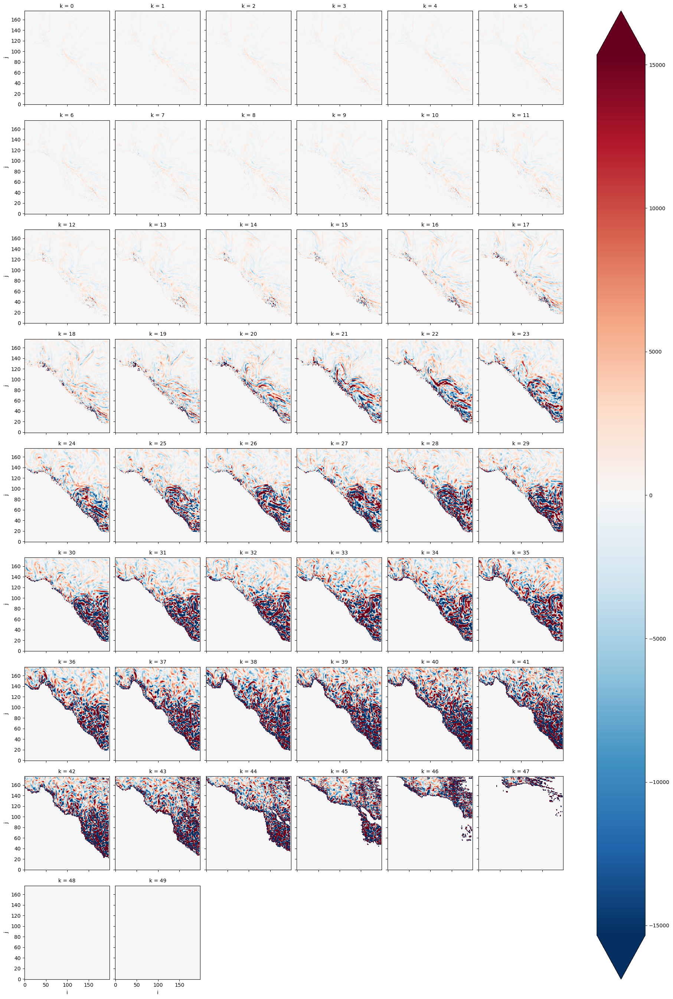

In [42]:
## we find the total volume flux - m3
F_uv_vol = (
    ds.u * ds.dy_t * ds.dz_t - ds.u.shift(i=-1)* ds.dy_t * ds.dz_t 
    + ds.v * ds.dx_t * ds.dz_t - ds.v.shift(j=-1) * ds.dx_t * ds.dz_t
).fillna(0)

F_uv_vol.isel(time=0).plot(x='i',y='j',col='k',col_wrap=6, robust=True)

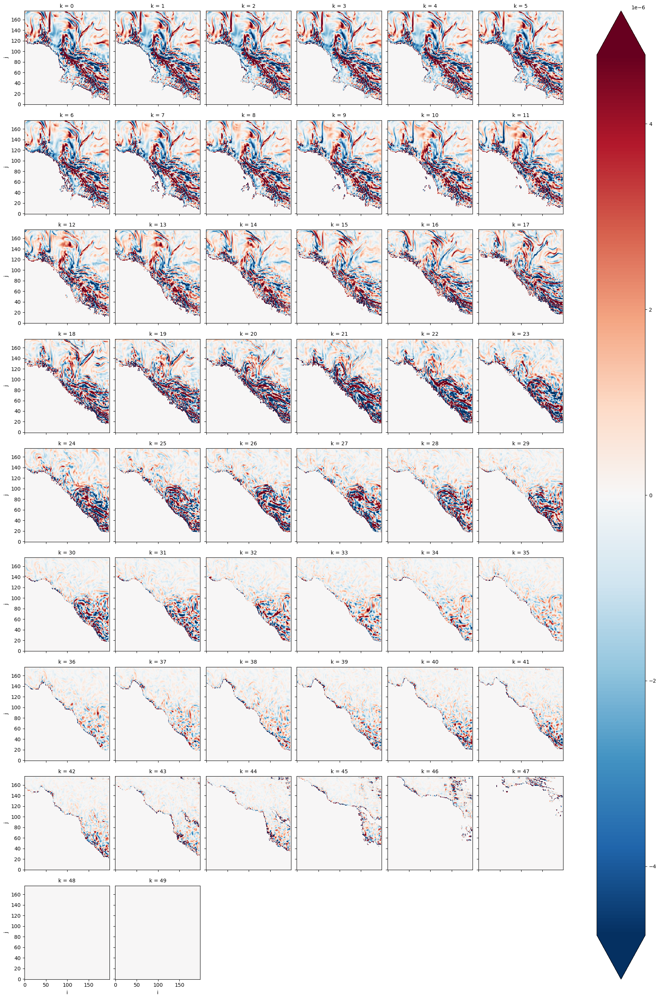

In [66]:
#we divide the total flux by the volume (dx*dy*dz) - 1/s
dw_by_dz = F_uv_vol/ds.dx_t/ds.dy_t/ds.dz_t

dw_by_dz.isel(time=0).plot(x='i',y='j',col='k',col_wrap=6, robust=True)

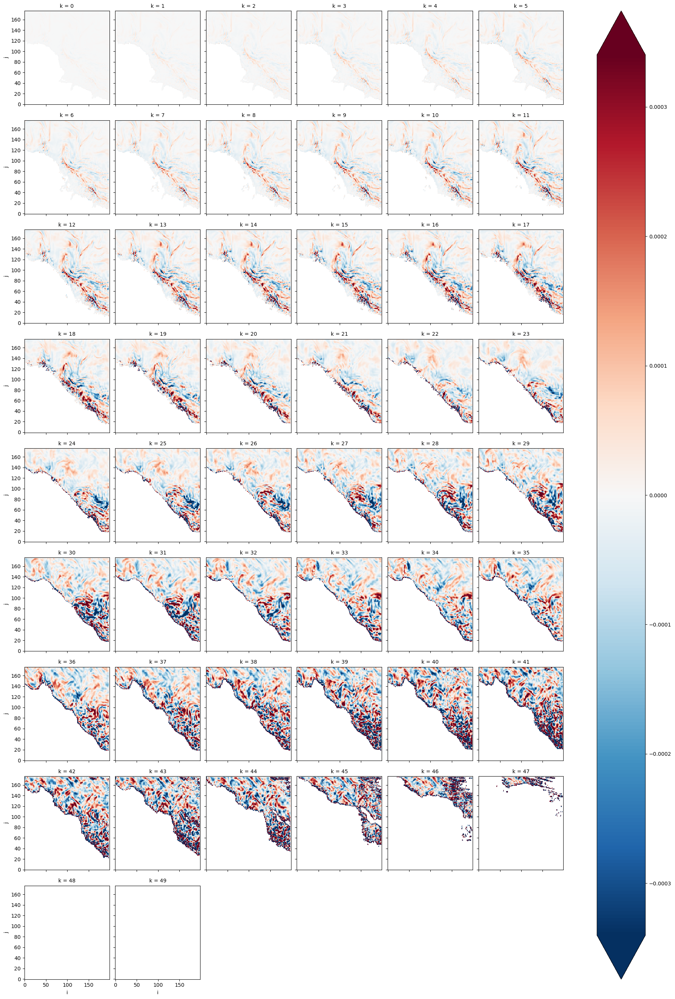

In [67]:
# w = (dw_by_dz * ds.dz_t).isel(k=slice(None, None, -1)).fillna(0).cumsum(dim='k').where(ds.tmask==1).isel(k=slice(None, None, -1))
w = (dw_by_dz.fillna(0) * ds.dz_t.fillna(0)).cumsum('k').fillna(0).where(ds.tmask==1)
w.isel(time=0).plot(x='i',y='j',col='k',col_wrap=6, robust=True)

In [68]:
w_bottom=w.isel(k=ds.tmask.sum('k')-1)

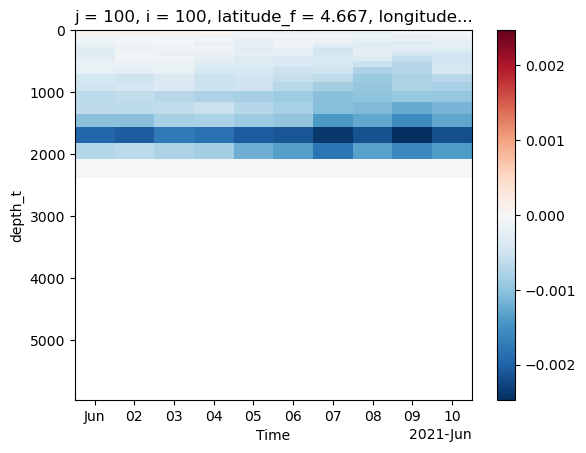

In [69]:
w_correct = w - w_bottom / ds.dz_t.where(ds.tmask==1).sum('k') * ds.depth_w
w_correct.isel(j=100,i=100).plot(x='time',y='depth_t')
plt.gca().invert_yaxis()

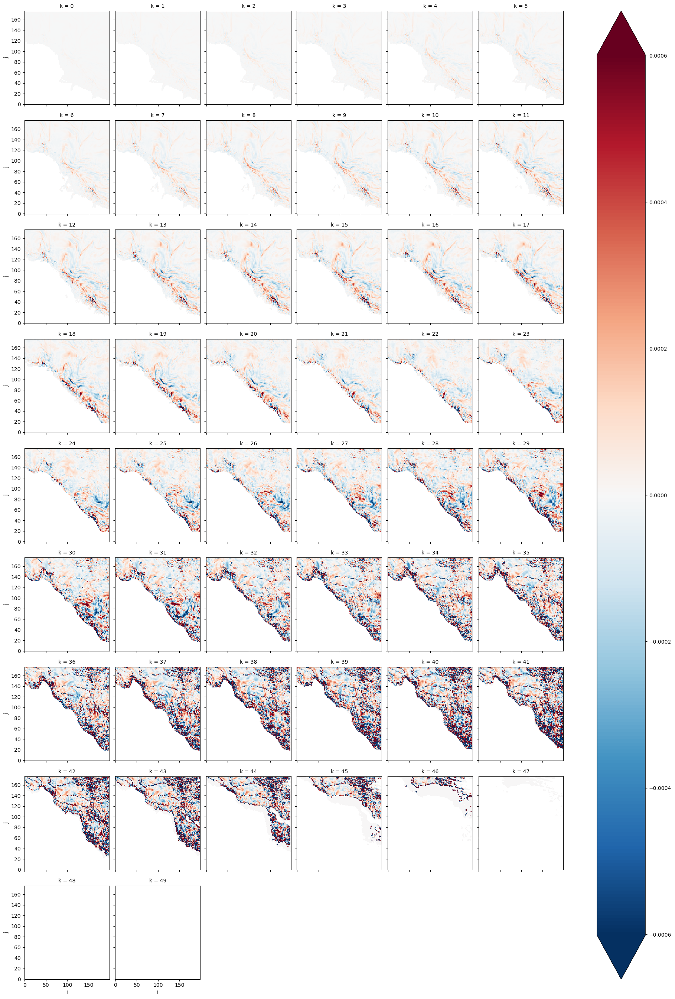

In [70]:
w_correct.isel(time=0).plot(x='i',y='j',col='k',col_wrap=6, robust=True)

<xarray.DataArray ()> Size: 8B
array(0.00033776)
Coordinates:
    dy_t     float64 8B 9.266e+03
<xarray.DataArray ()> Size: 8B
array(-3.8930711e-06)
Coordinates:
    dy_t     float64 8B 9.266e+03


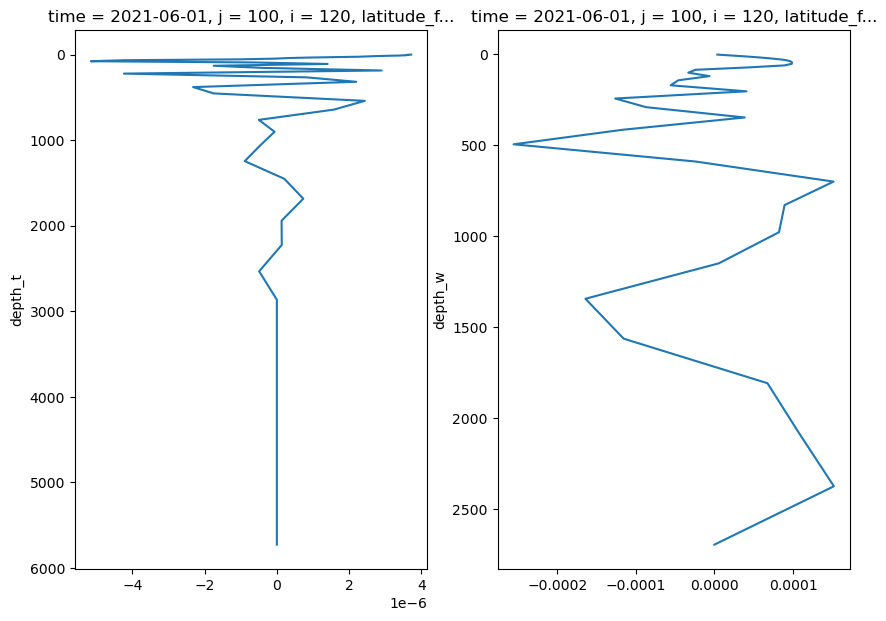

In [93]:
fig,ax = plt.subplots(1,2,figsize=(10,7))
dw_by_dz.isel(time=0,i=120,j=100).plot(y='depth_t',ax=ax[0])
w_correct.isel(time=0,i=120,j=100).plot(y='depth_w',ax=ax[1])

print(np.std(w_correct))
print(np.mean(w_correct))

ax[0].invert_yaxis()
ax[1].invert_yaxis()

### My version

In [82]:
# (ds.dx_t * ds.dy_t).shape
# div.shape
print(ds.dx_t.shape)
print(ds.dy_t.shape)
print(ds.dz_t.shape)
print(ds.u.shape)

(177,)
()
(50,)
(10, 50, 177, 199)


std <xarray.DataArray ()> Size: 8B
array(1.34289072e-05)
Coordinates:
    dy_t     float64 8B 9.266e+03
mean <xarray.DataArray ()> Size: 8B
array(-5.78314491e-08)
Coordinates:
    dy_t     float64 8B 9.266e+03


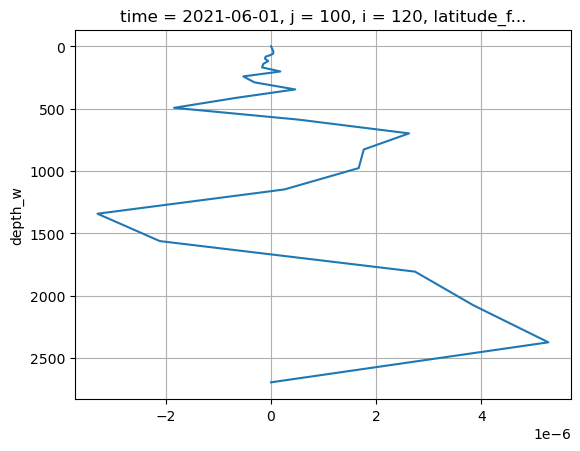

In [92]:
#we find the fluxes and add them : horizontal flux divergence = dF(u*dy*dz)/dx + dF(v*dx*dz)/dy -m2
div = (
    (ds.u.shift(i=-1)* ds.dy_t * ds.dz_t - ds.u * ds.dy_t * ds.dz_t)/ds.dx_t 
    + (ds.v.shift(j=-1) * ds.dx_t * ds.dz_t - ds.v * ds.dx_t * ds.dz_t)/ds.dy_t
).fillna(0)

#we multiply div * dz_t and integrate
wk = (-div.fillna(0) * ds.dz_t.fillna(0)).cumsum('k').fillna(0).where(ds.tmask==1)
wkk = wk/ds.dx_t/ds.dy_t

w_bk=wkk.isel(k=ds.tmask.sum('k')-1)
w_ck = wkk - w_bk / ds.dz_t.where(ds.tmask==1).sum('k') * ds.depth_w

##plot 
w_ck.isel(time=0,i=120,j=100).plot(y='depth_w')
plt.gca().invert_yaxis()
plt.grid()

print('std',np.std(w_ck))
print('mean',np.mean(w_ck))

### Plotting

In [72]:
lat_min, lat_max = 8, 10
lon_min, lon_max = -49, -47
#--- Mask for W 
mask = (
    ((w.latitude_t>= lat_min) & (w.latitude_t <= lat_max)) &
    ((w.longitude_t >= lon_min) & (w.longitude_t <= lon_max))
)

# Convert boolean to integer (1 inside the box, 0 outside)
binary_mask = mask.astype(int)

mask_3f = xr.broadcast(w.isel(k=0)*0 + 1, binary_mask)[1]
mask_3f = mask_3f.where(mask_3f!=0,np.nan)

## ----- max for U,V in the corners
mask = (
    ((ds.latitude_t >= lat_min) & (ds.latitude_t <= lat_max)) &
    ((ds.longitude_t >= lon_min) & (ds.longitude_t <= lon_max))
)

# Convert boolean to integer (1 inside the box, 0 outside)
bmask = mask.astype(int)

# Broadcast to depth
mask_3c = xr.broadcast(ds.u.isel(k=0)*0 + 1, bmask)[1]


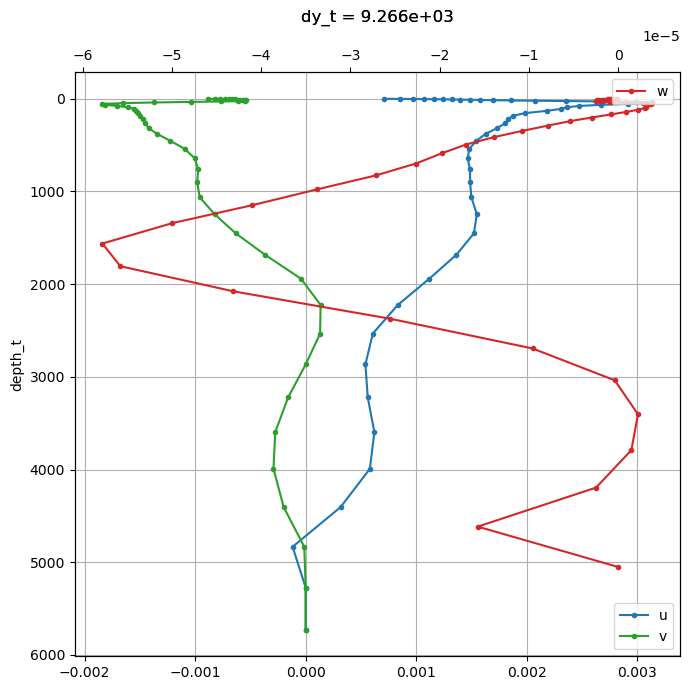

In [73]:
uu = (ds.u * mask_3c)
vv = (ds.v * mask_3c)
ww = (w_correct * mask_3f)


fig, ax = plt.subplots(figsize=(7, 7))

# Eje inferior: u y v
uu.mean(dim=('j', 'i','time'), skipna=True).plot(
    y='depth_t', marker='.', label='u', ax=ax, color='tab:blue')

vv.mean(dim=('j', 'i','time'), skipna=True).plot(
    y='depth_t', marker='.', label='v', ax=ax, color='tab:green')

# ax.set_ylim(0, 1500)
ax.invert_yaxis()
ax.grid(visible=True)
ax.legend(loc='lower right')

# Eje superior: w
ax2 = ax.twiny()
ww.mean(dim=('j', 'i','time'), skipna=True).plot(
    y='depth_w', marker='.', label='w', ax=ax2, color='tab:red')

ax2.legend(loc='upper right')
# ax2.set_xlim(-1e-6,1e-6)

plt.tight_layout()
# plt.grid(True)
plt.show()

### Try 2 kinda succesfull

In [84]:
dF_u_dx = (ds.u - ds.u.shift(i=-1)) * ds.dy_t * ds.dz_t / ds.dx_t
dF_v_dy = (ds.v - ds.v.shift(j=-1)) * ds.dx_t * ds.dz_t / ds.dy_t

div_flux = dF_u_dx.fillna(0) + dF_v_dy.fillna(0)
integrand = -div_flux.fillna(0) / (ds.dx_t.fillna(0) * ds.dy_t.fillna(0))
w = integrand.isel(k=slice(None, None, -1)).fillna(0).where(ds.tmask==1).cumsum(dim='k',skipna=True).isel(k=slice(None, None, -1))

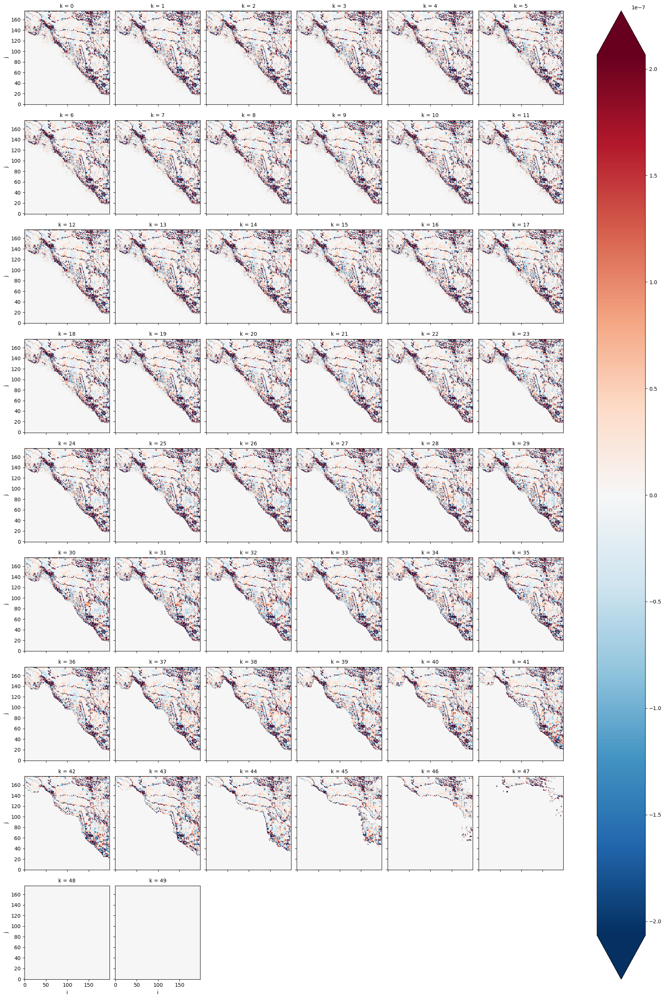

In [85]:
# np.isnan(w).sum()
w.isel(time=0).plot(x='i',y='j',col='k',col_wrap=6, robust=True)

### Didn't Work

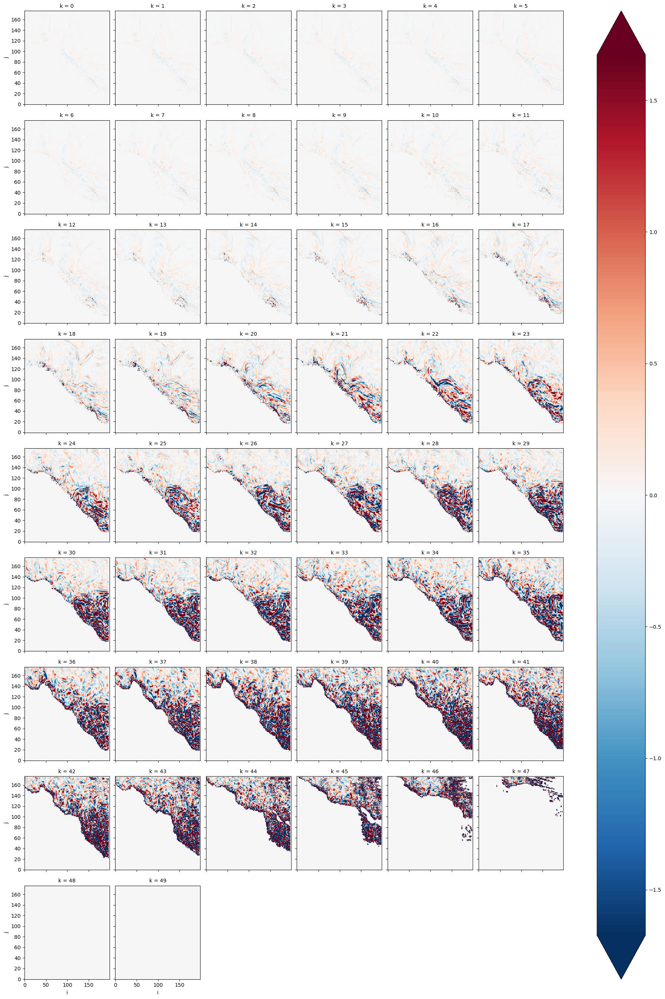

In [13]:
# 4. Compute fluxes
F_u = ds.u * ds.dy_t * ds.dz_t  # zonal volume flux
F_v = ds.v * ds.dx_t * ds.dz_t  # meridional volume flux

# 5. Compute divergence of volume fluxes
dF_u_dx = (F_u.shift(i=-1) - F_u) / ds.dx_t
dF_v_dy = (F_v.shift(j=-1) - F_v) / ds.dy_t

div_flux = dF_u_dx + dF_v_dy
div_flux.isel(time=0).plot(x='i',y='j',col='k',col_wrap=6, robust=True)

In [17]:
integrand = -div_flux * ds.dz_t
w_ = integrand.isel(k=slice(None, None, -1)).fillna(0).cumsum(dim='k')
w_ = w_.isel(k=slice(None, None, -1))  # reverse back
w_

<xarray.DataArray (time: 10, k: 50, j: 177, i: 199)> Size: 141MB
array([[[[   -0.        ,    -0.        ,    -0.        , ...,
             -0.        ,    -0.        ,     0.        ],
         [   -0.        ,    -0.        ,    -0.        , ...,
             -0.        ,    -0.        ,     0.        ],
         [   -0.        ,    -0.        ,    -0.        , ...,
             -0.        ,    -0.        ,     0.        ],
         ...,
         [ 4069.71947833, -2459.70228458,    82.74247302, ...,
           -262.65086752, -7097.62302283,     0.        ],
         [ 1447.17844884, -2552.94865058,  -533.69561157, ...,
           -425.86816163, -2851.61262521,     0.        ],
         [    0.        ,     0.        ,     0.        , ...,
              0.        ,     0.        ,     0.        ]],

        [[   -0.        ,    -0.        ,    -0.        , ...,
             -0.        ,    -0.        ,     0.        ],
         [   -0.        ,    -0.        ,    -0.        , ...,
             -0.        ,    -0.        ,     0.        ],
         [   -0.        ,    -0.        ,    -0.        , ...,
             -0.        ,    -0.        ,     0.        ],
...
             -0.        ,    -0.        ,     0.        ],
         [   -0.        ,    -0.        ,    -0.        , ...,
             -0.        ,    -0.        ,     0.        ],
         [    0.        ,     0.        ,     0.        , ...,
              0.        ,     0.        ,     0.        ]],

        [[   -0.        ,    -0.        ,    -0.        , ...,
             -0.        ,    -0.        ,     0.        ],
         [   -0.        ,    -0.        ,    -0.        , ...,
             -0.        ,    -0.        ,     0.        ],
         [   -0.        ,    -0.        ,    -0.        , ...,
             -0.        ,    -0.        ,     0.        ],
         ...,
         [   -0.        ,    -0.        ,    -0.        , ...,
             -0.        ,    -0.        ,     0.        ],
         [   -0.        ,    -0.        ,    -0.        , ...,
             -0.        ,    -0.        ,     0.        ],
         [    0.        ,     0.        ,     0.        , ...,
              0.        ,     0.        ,     0.        ]]]],
      shape=(10, 50, 177, 199))
Coordinates: (12/17)
  * time         (time) datetime64[ns] 80B 2021-06-01 2021-06-02 ... 2021-06-10
  * k            (k) int64 400B 0 1 2 3 4 5 6 7 8 ... 41 42 43 44 45 46 47 48 49
  * j            (j) int64 1kB 0 1 2 3 4 5 6 7 ... 170 171 172 173 174 175 176
  * i            (i) int64 2kB 0 1 2 3 4 5 6 7 ... 192 193 194 195 196 197 198
    depth_t      (k) float32 200B 0.494 1.541 2.646 ... 5.275e+03 5.728e+03
    latitude_f   (j) float32 708B -3.667 -3.583 -3.5 -3.417 ... 10.83 10.92 11.0
    ...           ...
    longitude_v  (i) float32 796B -57.71 -57.62 -57.54 ... -41.37 -41.29 -41.21
    latitude_t   (j) float32 708B -3.625 -3.542 -3.458 ... 10.88 10.96 11.04
    longitude_t  (i) float32 796B -57.71 -57.62 -57.54 ... -41.37 -41.29 -41.21
    dz_t         (k) float32 200B 0.988 1.107 1.102 1.246 ... 435.3 447.7 458.6
    dx_t         (j) float64 1kB 9.248e+03 9.249e+03 ... 9.097e+03 9.095e+03
    dy_t         float64 8B 9.266e+03

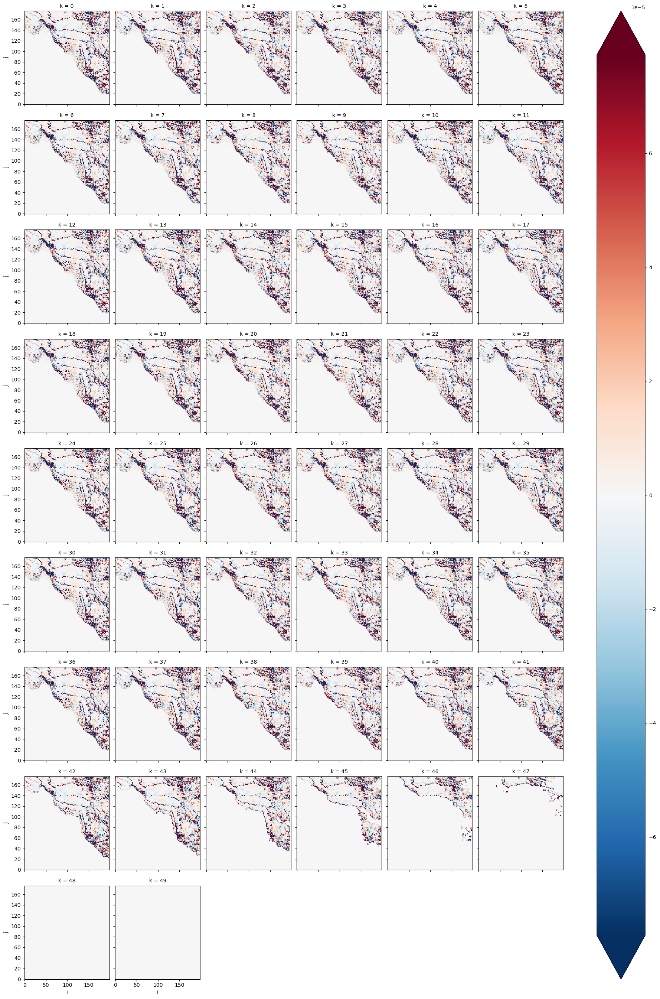

In [20]:
w = w_ / (ds.dx_t * ds.dy_t)
w.isel(time=0).plot(x='i',y='j',col='k',col_wrap=6, robust=True)

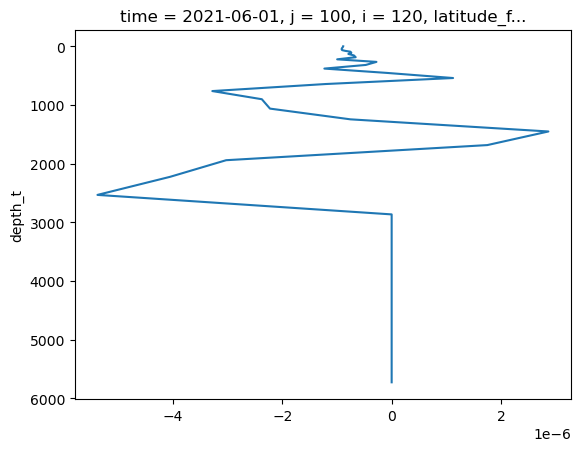

In [22]:
w.isel(time=0,i=120,j=100).plot(y='depth_t')
plt.gca().invert_yaxis()

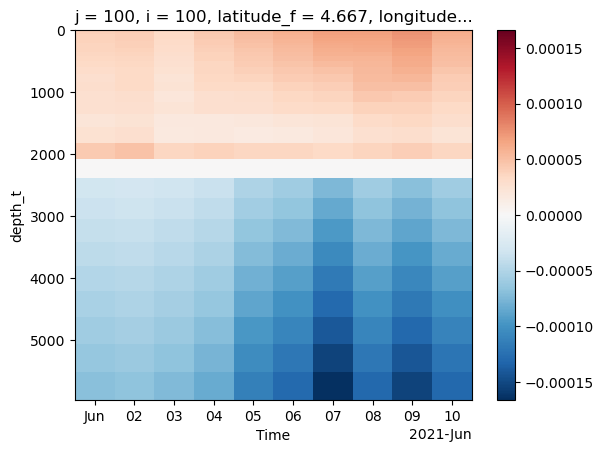

In [24]:
w_bottom=w.isel(k=ds.tmask.sum('k')-1)

w_correct = w - (w_bottom / ds.dz_t.where(ds.tmask==1).sum('k') * ds.depth_w)
w_correct.isel(j=100,i=100).plot(x='time',y='depth_t')
plt.gca().invert_yaxis()